In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import folium
from shapely.geometry import Point

plt.rcParams['figure.figsize'] = (10,5)

c:\Users\jdamodhar\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\_compat.py:153: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  set_use_pygeos()
C:\Users\jdamodhar\AppData\Local\Temp\ipykernel_72312\705015369.py:2: DeprecationWarning: GeoPandas is set to use PyGEOS over Shapely. PyGEOS support is deprecatedand will be removed in GeoPandas 1.0, released in the Q1 of 2024. Please migrate to Shapely 2.0 (https://geopandas.org/en/stable/docs/user_guide/pygeos_to_shapely.html).
  import geopandas as gpd


In [19]:
permits = gpd.read_file('.//building_permits_2017.csv')
council_districts = gpd.read_file('.//council_districts.geojson')

In [20]:
# Create a shapely Point from lat and lng
permits['geometry'] = permits.apply(lambda x: Point((float(x.lng), float(x.lat))), axis=1)

# Build a GeoDataFrame: permits_geo
permits_geo = gpd.GeoDataFrame(permits, crs = council_districts.crs, geometry=permits.geometry)

# Spatial join of permits_geo and council_districts
permits_by_district = gpd.sjoin(permits_geo, council_districts, op='within')
print(permits_by_district.head(2))

# Create permit_counts
permit_counts = permits_by_district.groupby(['district']).size()
print(permit_counts)

c:\Users\jdamodhar\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\dtypes\cast.py:126: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


     permit_id      issued      cost        lat         lng  \
0   2017032777  2017-05-24  226201.0  36.198241  -86.742235   
68  2017053890  2017-09-05       0.0  36.185442  -86.768239   

                      geometry  index_right first_name  \
0   POINT (-86.74223 36.19824)            5      Scott   
68  POINT (-86.76824 36.18544)            5      Scott   

                        email     res_phone     bus_phone last_name  \
0   scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   
68  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   

          position district  
0   Council Member        5  
68  Council Member        5  
district
1     146
10    119
11    239
12    163
13    139
14    261
15    322
16    303
17    786
18    287
19    969
2     399
20    799
21    569
22    291
23    206
24    458
25    435
26    179
27    105
28    119
29    154
3     215
30     79
31    134
32    225
33    355
34    218
35    192
4     139
5     452
6     455
7 

C:\Users\jdamodhar\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [21]:
# Create an area column in council_districts
council_districts['area'] = council_districts.geometry.area
print(council_districts.head(2))

# Convert permit_counts to a DataFrame
permits_df = permit_counts.to_frame()
print(permits_df.head(2))

# Reset index and column names
permits_df.reset_index(inplace=True)
permits_df.columns = ['district', 'bldg_permits']
print(permits_df.head(2))

# Merge council_districts and permits_df
districts_and_permits = pd.merge(council_districts, permits_df, on='district')
print(districts_and_permits.head(2))

C:\Users\jdamodhar\AppData\Local\Temp\ipykernel_49696\317198333.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  council_districts['area'] = council_districts.geometry.area


  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   

  last_name        position district  \
0  Leonardo  Council Member        1   
1  Hastings  Council Member        2   

                                            geometry      area  
0  MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...  0.022786  
1  MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...  0.002927  
            0
district     
1         146
10        119
  district  bldg_permits
0        1           146
1       10           119
  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   

  last_name        position district  \
0  Leonardo  Council Member        1   
1  Hastings  Co

In [22]:
# Print the type of districts_and_permits
print(type(districts_and_permits))

# Create permit_density column in districts_and_permits
districts_and_permits['permit_density'] = districts_and_permits.apply(lambda row: row.bldg_permits/row.area, axis=1)

# Print the head of districts_and_permits
(districts_and_permits.head())

<class 'geopandas.geodataframe.GeoDataFrame'>


,first_name,email,res_phone,bus_phone,last_name,position,district,geometry,area,bldg_permits,permit_density
0,Nick,nick.leonardo@nashville.gov,615-509-6334,615-862-6780,Leonardo,Council Member,1,"MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...",0.022786,146,6407.401089
1,DeCosta,decosta.hastings@nashville.gov,615-779-1565,615-862-6780,Hastings,Council Member,2,"MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...",0.002927,399,136305.586710
2,Nancy,nancy.vanreece@nashville.gov,615-576-0488,615-862-6780,VanReece,Council Member,8,"MULTIPOLYGON (((-86.72850 36.28328, -86.72791 ...",0.002517,209,83049.371383
3,Bill,bill.pridemore@nashville.gov,615-915-1419,615-862-6780,Pridemore,Council Member,9,"MULTIPOLYGON (((-86.68681 36.28671, -86.68706 ...",0.002883,186,64514.836204
4,Robert,robert.swope@nashville.gov,615-308-0577,615-862-6780,Swope,Council Member,4,"MULTIPOLYGON (((-86.74489 36.05316, -86.74491 ...",0.002052,139,67741.788057


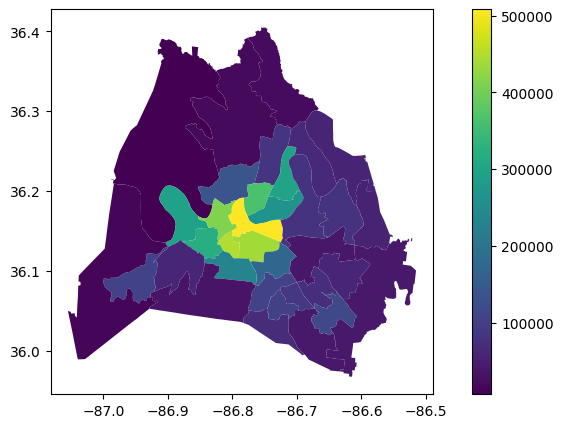

In [23]:
# Simple plot of building permit_density
districts_and_permits.plot(column='permit_density', legend=True);

Text(0.5, 1.0, '2017 Building Project Density by Council District')

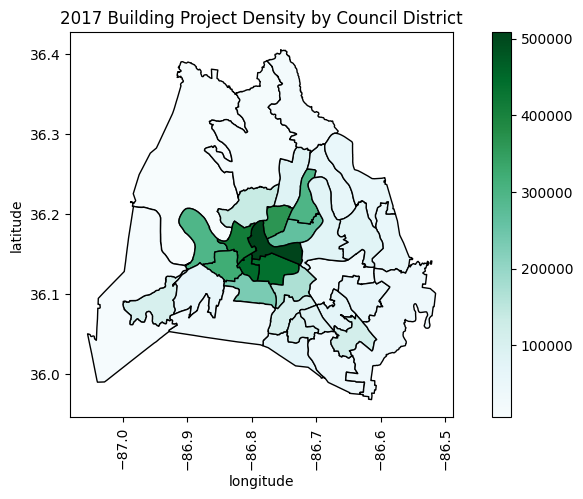

In [24]:
# Polished choropleth of building permit_density
districts_and_permits.plot(column = 'permit_density', cmap = 'BuGn', edgecolor = 'black', legend = True)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xticks(rotation = 'vertical')
plt.title('2017 Building Project Density by Council District')

In [25]:
# Change council_districts crs to epsg 3857
council_districts = council_districts.to_crs(epsg=3857)
print(council_districts.crs)
(council_districts.head())


EPSG:3857


,first_name,email,res_phone,bus_phone,last_name,position,district,geometry,area
0,Nick,nick.leonardo@nashville.gov,615-509-6334,615-862-6780,Leonardo,Council Member,1,"MULTIPOLYGON (((-9674485.565 4354489.556, -967...",0.022786
1,DeCosta,decosta.hastings@nashville.gov,615-779-1565,615-862-6780,Hastings,Council Member,2,"MULTIPOLYGON (((-9657970.373 4332440.650, -965...",0.002927
2,Nancy,nancy.vanreece@nashville.gov,615-576-0488,615-862-6780,VanReece,Council Member,8,"MULTIPOLYGON (((-9654572.680 4339671.152, -965...",0.002517
3,Bill,bill.pridemore@nashville.gov,615-915-1419,615-862-6780,Pridemore,Council Member,9,"MULTIPOLYGON (((-9649930.991 4340143.590, -964...",0.002883
4,Robert,robert.swope@nashville.gov,615-308-0577,615-862-6780,Swope,Council Member,4,"MULTIPOLYGON (((-9656396.833 4307939.015, -965...",0.002052


In [26]:

# Create area in square km
sqm_to_sqkm = 10 ** 6
council_districts['area'] = council_districts.geometry.area / sqm_to_sqkm

# Change council_districts crs back to epsg 4326
council_districts = council_districts.to_crs(epsg=4326)
print(council_districts.crs)
(council_districts.head())

EPSG:4326


,first_name,email,res_phone,bus_phone,last_name,position,district,geometry,area
0,Nick,nick.leonardo@nashville.gov,615-509-6334,615-862-6780,Leonardo,Council Member,1,"MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...",350.194851
1,DeCosta,decosta.hastings@nashville.gov,615-779-1565,615-862-6780,Hastings,Council Member,2,"MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...",44.956987
2,Nancy,nancy.vanreece@nashville.gov,615-576-0488,615-862-6780,VanReece,Council Member,8,"MULTIPOLYGON (((-86.72850 36.28328, -86.72791 ...",38.667932
3,Bill,bill.pridemore@nashville.gov,615-915-1419,615-862-6780,Pridemore,Council Member,9,"MULTIPOLYGON (((-86.68681 36.28671, -86.68706 ...",44.295293
4,Robert,robert.swope@nashville.gov,615-308-0577,615-862-6780,Swope,Council Member,4,"MULTIPOLYGON (((-86.74489 36.05316, -86.74491 ...",31.441618


In [27]:
# Create permits_geo
permits_geo = gpd.GeoDataFrame(permits, crs=council_districts.crs, geometry=permits.geometry)

# Spatially join permits_geo and council_districts
permits_by_district = gpd.sjoin(permits_geo, council_districts, op='within')

# Count permits in each district
permits_counts = permits_by_district.groupby(['district']).size()

# Convert permit_counts to a df with 2 columns: district and bldg_permits
counts_df = permits_counts.to_frame()
counts_df.reset_index(inplace=True)
counts_df.columns = ['district', 'bldg_permits']
(counts_df.head(2))

C:\Users\jdamodhar\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,district,bldg_permits
0,1,146
1,10,119


In [28]:
# Merge permits_by_district and counts_df
districts_and_permits = pd.merge(permits_by_district, counts_df, on='district')

# Create permit_density column
districts_and_permits['permit_density'] = districts_and_permits.apply(lambda row: row.bldg_permits / row.area, axis=1)
print(districts_and_permits.head(2))

# Create choropleth plot
districts_and_permits.plot(column='permit_density', cmap='OrRd', edgecolor='black', legend=True);

# Add axis labels and title
plt.xlabel('longitude');
plt.ylabel('latitude');
plt.title('2017 Building Project Density by Council District');

    permit_id      issued      cost        lat         lng  \
0  2017032777  2017-05-24  226201.0  36.198241  -86.742235   
1  2017053890  2017-09-05       0.0  36.185442  -86.768239   

                     geometry  index_right first_name  \
0  POINT (-86.74223 36.19824)            5      Scott   
1  POINT (-86.76824 36.18544)            5      Scott   

                       email     res_phone     bus_phone last_name  \
0  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   
1  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   

         position district       area  bldg_permits  permit_density  
0  Council Member        5  19.030612           452       23.751207  
1  Council Member        5  19.030612           452       23.751207  


In [ ]:
# Center point for Nashville
nashville = [36.1636,-86.7823]

# Create map
m = folium.Map(location=nashville, zoom_start=10)

# Build choropleth
folium.Choropleth(
    geo_data=r'.//council_districts.geojson',
    name='geometry',
    data=districts_and_permits,
    columns=['district', 'permit_density'],
    key_on='feature.properties.district',
    fill_color='Reds',
    fill_opacity=0.5,
    line_opacity=1.0,
    legend_name='2017 Permitted Building Projects per km squared',
    
).add_to(m)

folium.LayerControl().add_to(m)

m.save('.//permits_choropleth.html')

In [ ]:
# Create center column for the centroid of each district
districts_and_permits['center'] = districts_and_permits.centroid

# Build markers and popups
for row in districts_and_permits.iterrows():
    row_values = row[1]
    center_point = row_values['center']
    location = [center_point.y, center_point.x]
    popup = ('Council District: ' + str(row_values['district']) + 
             ';  ' + 'permits issued: ' + str(row_values['bldg_permits']))
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(m)
    
# Display the map
display(m)

C:\Users\jdamodhar\AppData\Local\Temp\ipykernel_49696\2265016160.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  districts_and_permits['center'] = districts_and_permits.centroid
